[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://github.com/indiradutta/DC_GAN/blob/main/demo/dcgan_standalone_demo.ipynb)


# **DC_GAN**

This standalone colab notebook demonstrates how you can use the DC_GAN module for training and visualizing the generated images

In [ ]:
!git clone https://github.com/indiradutta/DC_GAN

Cloning into 'DC_GAN'...
remote: Enumerating objects: 125, done.
remote: Counting objects: 100% (125/125), done.
remote: Compressing objects: 100% (102/102), done.
remote: Total 125 (delta 54), reused 27 (delta 8), pack-reused 0
Receiving objects: 100% (125/125), 15.90 MiB | 12.10 MiB/s, done.
Resolving deltas: 100% (54/54), done.


In [ ]:
!gdown --id 1yW6QkWcd6sWYB2rw9d-A36woiXVLTpny

Downloading...
From: https://drive.google.com/uc?id=1yW6QkWcd6sWYB2rw9d-A36woiXVLTpny
To: /content/img_align_celeba.zip
1.44GB [00:14, 103MB/s] 


In [ ]:
!mkdir celeba

In [ ]:
!unzip /content/img_align_celeba.zip -d /content/celeba

Streaming output truncated to the last 5000 lines.
 extracting: /content/celeba/img_align_celeba/197600.jpg  
 extracting: /content/celeba/img_align_celeba/197601.jpg  
 extracting: /content/celeba/img_align_celeba/197602.jpg  
 extracting: /content/celeba/img_align_celeba/197603.jpg  
 extracting: /content/celeba/img_align_celeba/197604.jpg  
 extracting: /content/celeba/img_align_celeba/197605.jpg  
 extracting: /content/celeba/img_align_celeba/197606.jpg  
 extracting: /content/celeba/img_align_celeba/197607.jpg  
 extracting: /content/celeba/img_align_celeba/197608.jpg  
 extracting: /content/celeba/img_align_celeba/197609.jpg  
 extracting: /content/celeba/img_align_celeba/197610.jpg  
 extracting: /content/celeba/img_align_celeba/197611.jpg  
 extracting: /content/celeba/img_align_celeba/197612.jpg  
 extracting: /content/celeba/img_align_celeba/197613.jpg  
 extracting: /content/celeba/img_align_celeba/197614.jpg  
 extracting: /content/celeba/img_align_celeba/197615.jpg  
 extr

# **Training**

In [ ]:
from DC_GAN.dcgan import DCGAN

# Initializing the DCGAN module with celeba dataset
dc_gan = DCGAN(data = '/content/celeba')

# Training for num_epoch times
img_list, G_losses, D_losses = dc_gan.train()

Training...
[1/5][0/1583]	Loss_D: 1.3844	Loss_G: 0.7001	D(x): 0.5002	D(G(z)): 0.4992 / 0.4965
[1/5][50/1583]	Loss_D: 0.5045	Loss_G: 1.0757	D(x): 0.9733	D(G(z)): 0.3744 / 0.3411
[1/5][100/1583]	Loss_D: 0.8352	Loss_G: 0.7461	D(x): 0.8833	D(G(z)): 0.4967 / 0.4742
[1/5][150/1583]	Loss_D: 0.8176	Loss_G: 0.9180	D(x): 0.8285	D(G(z)): 0.4424 / 0.3994
[1/5][200/1583]	Loss_D: 0.8791	Loss_G: 0.8056	D(x): 0.9125	D(G(z)): 0.5403 / 0.4477
[1/5][250/1583]	Loss_D: 1.0269	Loss_G: 0.6589	D(x): 0.8357	D(G(z)): 0.5550 / 0.5193
[1/5][300/1583]	Loss_D: 0.9713	Loss_G: 0.7572	D(x): 0.8073	D(G(z)): 0.5208 / 0.4699
[1/5][350/1583]	Loss_D: 1.2306	Loss_G: 0.6952	D(x): 0.6576	D(G(z)): 0.5126 / 0.5024
[1/5][400/1583]	Loss_D: 1.1767	Loss_G: 0.6517	D(x): 0.7141	D(G(z)): 0.5460 / 0.5287
[1/5][450/1583]	Loss_D: 1.1372	Loss_G: 0.7126	D(x): 0.7072	D(G(z)): 0.5325 / 0.4927
[1/5][500/1583]	Loss_D: 1.0531	Loss_G: 0.7720	D(x): 0.6979	D(G(z)): 0.4874 / 0.4690
[1/5][550/1583]	Loss_D: 1.1521	Loss_G: 0.9366	D(x): 0.7476	D(G(z)):

# **Plot of D & G’s losses versus training iterations**

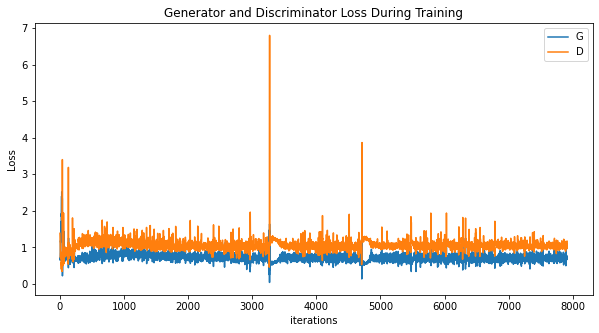

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# **Visualization**

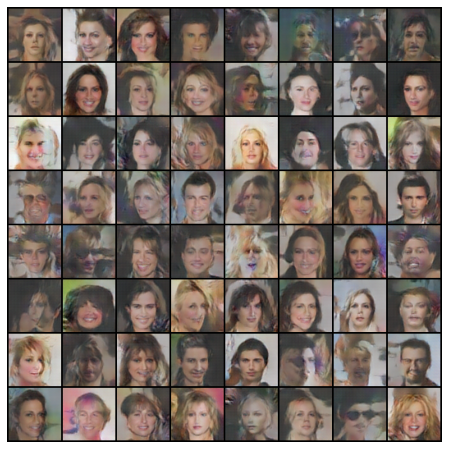

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())